In [1]:
import os 
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import mean_absolute_error
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.activations import relu
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.losses import MAE
from sklearn.metrics import mean_absolute_error

def case_preprocessing():
    dataset = list()
    only_train_dataset = list()
    df = pd.DataFrame()
    train_df = pd.DataFrame()   # 새로운 Col 만들기 
    dir_path = 'C:\\Users\\gusrl\\opendrift\\drift_trajection'
    pastDir_path = 'C:\\Users\\gusrl\\opendrift\\drift_trajection\\Past_data'
    
    # hour, wind(바람의 x축,y축 방향 각각 제곱합의 루트), water(해류의 x축,y축 방향 각각 제곱합의 루트)
    for k in range(1,16):
        only_train_dataset.append(pd.read_csv(os.path.join(pastDir_path ,(str(k)+'.csv'))))
                                  
    # 2016 (case 7)
    dataset.append(pd.read_csv(os.path.join(dir_path,'2016_case_003.csv')))
    dataset.append(pd.read_csv(os.path.join(dir_path,'2016_case_005.csv')))
    dataset.append(pd.read_csv(os.path.join(dir_path,'2016_case_010.csv')))
    dataset.append(pd.read_csv(os.path.join(dir_path,'2016_case_011.csv')))
    dataset.append(pd.read_csv(os.path.join(dir_path,'2016_case_015.csv')))
    dataset.append(pd.read_csv(os.path.join(dir_path,'2016_case_016.csv')))
    dataset.append(pd.read_csv(os.path.join(dir_path,'2016_case_040.csv')))

    # 2018(case 12)
    dataset.append(pd.read_csv(os.path.join(dir_path,'2018_case_005.csv')))
    # dataset_list.append(pd.read_csv(os.path.join(dir_path,'2018_case_008.csv')))
    dataset.append(pd.read_csv(os.path.join(dir_path,'2018_case_017.csv')))
    dataset.append(pd.read_csv(os.path.join(dir_path,'2018_case_027.csv')))
    dataset.append(pd.read_csv(os.path.join(dir_path,'2018_case_032.csv')))
    dataset.append(pd.read_csv(os.path.join(dir_path,'2018_case_034.csv')))
    # dataset_list.append(pd.read_csv(os.path.join(dir_path,'2018_case_045.csv')))
    dataset.append(pd.read_csv(os.path.join(dir_path,'2018_case_047.csv')))
    dataset.append(pd.read_csv(os.path.join(dir_path,'2018_case_082.csv')))
    dataset.append(pd.read_csv(os.path.join(dir_path,'2018_case_083.csv')))
    dataset.append(pd.read_csv(os.path.join(dir_path,'2018_case_090.csv')))
    dataset.append(pd.read_csv(os.path.join(dir_path,'2018_case_095.csv')))
    dataset.append(pd.read_csv(os.path.join(dir_path,'2018_case_097.csv')))

    # 2019(case 4)
    dataset.append(pd.read_csv(os.path.join(dir_path,'2019_case_000.csv')))
#     dataset.append(pd.read_csv(os.path.join(dir_path,'2019_case_001.csv')))
    dataset.append(pd.read_csv(os.path.join(dir_path,'2019_case_006.csv')))
    dataset.append(pd.read_csv(os.path.join(dir_path,'2019_case_007.csv')))
    dataset.append(pd.read_csv(os.path.join(dir_path,'2019_case_005.csv')))
    
    # 과거데이터 전처리 
    for i in range(len(only_train_dataset)):
        # 시간처리를 위해 time의 object type -> datetime64로 변경
        only_train_dataset[i]['time'] = pd.to_datetime(only_train_dataset[i]['time'],format = '%Y-%m-%d %H:%M', errors = 'raise')
        # hour열 생성
        only_train_dataset[i]['hour'] = only_train_dataset[i]['time'].dt.hour
        # wind 열 생성
        only_train_dataset[i]['wind'] = (only_train_dataset[i]['wind_x']**2 + only_train_dataset[i]['wind_y']**2)**(1/2)
        # water열 생성
        only_train_dataset[i]['water'] = (only_train_dataset[i]['water_velocity_x']**2 + only_train_dataset[i]['water_velocity_y']**2)**(1/2)
        # diff_lon열 생성
        only_train_dataset[i]['diff_lon'] = only_train_dataset[i]['obs_x1_lon'].diff() 
        only_train_dataset[i]['diff_lon'][0] = 0
        # diff_lat열 생성
        only_train_dataset[i]['diff_lat'] = only_train_dataset[i]['obs_x1_lat'].diff()
        only_train_dataset[i]['diff_lat'][0] = 0
        # diff열 생성
        only_train_dataset[i]['diff'] = (only_train_dataset[i]['diff_lon']**2 + only_train_dataset[i]['diff_lat']**2)**(1/2)
        # Null 값 제외
        
        only_train_dataset[i] = only_train_dataset[i].dropna()
        only_train_dataset[i] = only_train_dataset[i].reset_index(drop = True)
        
        
        # 초기좌표 (해역 나누기)
        only_train_dataset[i]['start_lon'] = only_train_dataset[i]['obs_x1_lon'][0]
        only_train_dataset[i]['start_lat'] = only_train_dataset[i]['obs_x1_lat'][0]
        
        # Smoothing (wind_x_ma, wind_y_ma, water_velocity_x_ma, water_velocity_y_ma 인자 추가) 
        only_train_dataset[i]['wind_x_ma'] = 0
        only_train_dataset[i]['wind_y_ma'] = 0
        only_train_dataset[i]['water_velocity_x_ma'] = 0
        only_train_dataset[i]['water_velocity_y_ma'] = 0 
        for j in range(1,len(only_train_dataset[i])-1):
            only_train_dataset[i]['wind_x_ma'][j] = (only_train_dataset[i]['wind_x'][j-1] + only_train_dataset[i]['wind_x'][j] + only_train_dataset[i]['wind_x'][j+1])/3
            only_train_dataset[i]['wind_y_ma'][j] = (only_train_dataset[i]['wind_y'][j-1] + only_train_dataset[i]['wind_y'][j] + only_train_dataset[i]['wind_y'][j+1])/3
            only_train_dataset[i]['water_velocity_x_ma'][j] = (only_train_dataset[i]['water_velocity_x'][j-1] + only_train_dataset[i]['water_velocity_x'][j] + only_train_dataset[i]['water_velocity_x'][j+1])/3
            only_train_dataset[i]['water_velocity_y_ma'][j] = (only_train_dataset[i]['water_velocity_y'][j-1] + only_train_dataset[i]['water_velocity_y'][j] + only_train_dataset[i]['water_velocity_y'][j+1])/3    
        df = only_train_dataset[i]
        indices = df.query('wind_x < -90 or wind_y < -90 or water_velocity_x < -90 or water_velocity_y < -90').index
        df.drop(indices, inplace=True)
        df.reset_index(drop = True, inplace=True)
        only_train_dataset[i] = df 
        
     # 기상청 데이터 전처리 
    for i in range(len(dataset)):
        # 시간처리를 위해 time의 object type -> datetime64로 변경
        dataset[i]['time'] = pd.to_datetime(dataset[i]['time'],format = '%Y-%m-%d %H:%M', errors = 'raise')
        # hour열 생성
        dataset[i]['hour'] = dataset[i]['time'].dt.hour
        # wind 열 생성
        dataset[i]['wind'] = (dataset[i]['wind_x']**2 + dataset[i]['wind_y']**2)**(1/2)
        # water열 생성
        dataset[i]['water'] = (dataset[i]['water_velocity_x']**2 + dataset[i]['water_velocity_y']**2)**(1/2)
        # diff_lon열 생성
        dataset[i]['diff_lon'] = dataset[i]['obs_x1_lon'].diff() 
        dataset[i]['diff_lon'][0] = 0
        # diff_lat열 생성
        dataset[i]['diff_lat'] = dataset[i]['obs_x1_lat'].diff()
        dataset[i]['diff_lat'][0] = 0
        # diff열 생성
        dataset[i]['diff'] = (dataset[i]['diff_lon']**2 + dataset[i]['diff_lat']**2)**(1/2)
        # Null 값 제외
        print('dd', dataset[i].dropna().sum())
        dataset[i] = dataset[i].dropna()
        dataset[i] = dataset[i].reset_index(drop = True)
        
        # 초기좌표 (해역 나누기)
        dataset[i]['start_lon'] = dataset[i]['obs_x1_lon'][0]
        dataset[i]['start_lat'] = dataset[i]['obs_x1_lat'][0]
        
        # Smoothing (wind_x_ma, wind_y_ma, water_velocity_x_ma, water_velocity_y_ma 인자 추가) 
        dataset[i]['wind_x_ma'] = 0
        dataset[i]['wind_y_ma'] = 0
        dataset[i]['water_velocity_x_ma'] = 0
        dataset[i]['water_velocity_y_ma'] = 0 
        for j in range(1,len(dataset[i])-1):
            dataset[i]['wind_x_ma'][j] = (dataset[i]['wind_x'][j-1] + dataset[i]['wind_x'][j] + dataset[i]['wind_x'][j+1])/3
            dataset[i]['wind_y_ma'][j] = (dataset[i]['wind_y'][j-1] + dataset[i]['wind_y'][j] + dataset[i]['wind_y'][j+1])/3
            dataset[i]['water_velocity_x_ma'][j] = (dataset[i]['water_velocity_x'][j-1] + dataset[i]['water_velocity_x'][j] + dataset[i]['water_velocity_x'][j+1])/3
            dataset[i]['water_velocity_y_ma'][j] = (dataset[i]['water_velocity_y'][j-1] + dataset[i]['water_velocity_y'][j] + dataset[i]['water_velocity_y'][j+1])/3
        
        # 삭제 전 원본 df
        df = pd.concat([df,dataset[i]],ignore_index = True)
        # 불필요열 삭제 
        pre_df = dataset[i].drop(columns = ['time','obs_x1_lon','obs_x1_lat','model_x2_lon','model_x2_lat'])  
        train_df = pd.concat([train_df, pre_df[1:-1]],ignore_index = True)
        
    df = df.reset_index(drop = True)
    train_df = train_df.reset_index(drop = True)
    return dataset, df, train_df, only_train_dataset

def drift_mae(y, predict_y):
    mae = mean_absolute_error(y, predict_y)
    return mae


def n2_mae(y, predict_y):
    n = y.shape[0]
    error_sum = 0
    
    for i in range(n):
        error_sum += abs((y[i][0] - predict_y[i][0])) + abs(( y[i][1] - predict_y[i][1]))
    
    mae = error_sum/(2*n)   
    
    return mae


def paper_mae(y, predict_y): # 논문  
    n = y.shape[0]
    error_sum = 0
    
    for i in range(n):
        error_sum += abs(y[i][0] - predict_y[i][0]) + abs(y[i][1] - predict_y[i][1])
    
    mae = error_sum/n    
    return mae

def NCLS_score(y, predict_y): # 1시간 
        # dl_i 구하기 
        dl_list, dl_sum, o_sum = list(), list(), 0
        n = y.shape[0]
        for i in range(1, n):
            # 위도 1도는 111.321, 경도 1도는 87.74km, 단위 km
            d_lon = y[i][0] - y[i-1][0]  
            d_lat = y[i][1] - y[i-1][1]
            # 거리 구하기
            point_distance = np.sqrt(np.power(d_lon,2) + np.power(d_lat,2))
            dl_list.append(point_distance)
            
        for i in range(len(dl_list)):
            temp = 0
            for j in range(i+1):
                temp += dl_list[j]
            dl_sum.append(temp)

        for i in range(len(dl_sum)):
            o_sum += dl_sum[i]
        
        # 예측모델의 d_i 구하기
        d_list = list()
        for i in range(1,n):
            # 위도 1도는 111.321 # 경도 1도는 55.802km
            d_lon = y[i][0] - predict_y[i][0]  
            d_lat = y[i][1] - predict_y[i][1]
            # 거리 구하기
            point_distance = np.sqrt(np.power(d_lon,2) + np.power(d_lat,2))
            d_list.append(point_distance)

        # s 구하기
        d_sum, s, ss_score = 0, 0, 0

        for i in range(len(d_list)):
            d_sum += d_list[i]

        s = d_sum/o_sum
        
        if s > 1:
                ss_score = 0
        else:
            ss_score = 1-s
        
        return ss_score

def drift_trajection_show(index, y_pred): 
    %matplotlib inline

    # 실제 위치
    lon = dataset[index]['obs_x1_lon']
    lon = np.array(lon)
    lat = dataset[index]['obs_x1_lat']
    lat = np.array(lat)
    
    # baseline
    baseline_lon = dataset[index]['model_x2_lon']
    baseline_lon = np.array(baseline_lon)
    baseline_lat = dataset[index]['model_x2_lat']
    baseline_lat = np.array(baseline_lat)

    # 예측값 
    first_lon = lon[0]
    first_lat = lat[0]
    lon_pred = np.zeros((y_pred.shape[0]+1,))
    lat_pred = np.zeros((y_pred.shape[0]+1,))
    lon_pred[0] = first_lon 
    lat_pred[0] = first_lat
    
    for i in range(1, lon_pred.shape[0]):
        lon_pred[i] = lon_pred[i-1] + y_pred[i-1][0]
        lat_pred[i] = lat_pred[i-1] + y_pred[i-1][1]
        
    return lon, lat, baseline_lon, baseline_lat, lon_pred, lat_pred

def roburst_scaler(train_X, test_X):
    from sklearn.preprocessing import RobustScaler
    rbs = RobustScaler()
    train_X_scaled = rbs.fit_transform(train_X)
    test_X_scaled = rbs.transform(test_X)
    return train_X_scaled, test_X_scaled

def data_augmenatation(dataset):
    for case in range(len(dataset)):
        df = dataset[case]
        length = len(df)
        index = 1
        for i in range(length-1):
            lon = (dataset[case]['obs_x1_lon'][i] + dataset[case]['obs_x1_lon'][i+1])/2
            lat = (dataset[case]['obs_x1_lat'][i] + dataset[case]['obs_x1_lat'][i+1])/2
            wind_x_mean = (dataset[case]['wind_x'][i] + dataset[case]['wind_x'][i+1])/2
            wind_y_mean = (dataset[case]['wind_y'][i] + dataset[case]['wind_y'][i+1])/2
            water_velocity_y_mean = (dataset[case]['water_velocity_y'][i] + dataset[case]['water_velocity_y'][i+1])/2
            water_velocity_x_mean = (dataset[case]['water_velocity_x'][i] + dataset[case]['water_velocity_x'][i+1])/2
            
            new_row = {'obs_x1_lon':lon, 'obs_x1_lat':lat,'wind_x':wind_x_mean, 'wind_y':wind_y_mean, 'water_velocity_y':water_velocity_y_mean, 'water_velocity_x':water_velocity_x_mean}
            temp1 = df[df.index < index]
            temp2 = df[df.index >= index]
            df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
            df.reset_index(drop = True, inplace=True)
            index += 2
                # diff_lon열 생성
        df['diff_lon'] = df['obs_x1_lon'].diff() 
        df['diff_lon'][0] = 0
        # diff_lat열 생성
        df['diff_lat'] = df['obs_x1_lat'].diff()
        df['diff_lat'][0] = 0
        dataset[case] = df

In [2]:
dataset, concat_df, train_df, only_train_dataset = case_preprocessing()

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  only_train_dataset[i]['diff_lon'][0] = 0
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:73: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  only_train_dataset[i]['diff_lat'][0] = 0
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  only_train_dataset

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  only_train_dataset[i]['diff_lon'][0] = 0
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:73: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  only_train_dataset[i]['diff_lat'][0] = 0
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  only_train_dataset

dd obs_x1_lon          9365.471710
obs_x1_lat          2625.377980
model_x2_lon        9397.252120
model_x2_lat        2619.735677
wind_y              -223.128525
wind_x              -169.814762
water_velocity_y       3.104966
water_velocity_x      -1.261281
hour                 828.000000
wind                 471.798834
water                  6.922849
diff_lon              -0.860890
diff_lat              -0.137430
diff                   1.260368
dtype: float64
dd obs_x1_lon          9385.393560
obs_x1_lat          2611.544350
model_x2_lon        9345.924320
model_x2_lat        2591.911581
wind_y                 7.113362
wind_x                 4.561414
water_velocity_y      -4.096806
water_velocity_x      -6.013417
hour                 828.000000
wind                 192.566420
water                 14.714293
diff_lon               0.689340
diff_lat               0.263490
diff                   0.975133
dtype: float64
dd obs_x1_lon          9402.538710
obs_x1_lat          2670.197370
m

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:114: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataset[i]['diff_lon'][0] = 0
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:117: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataset[i]['diff_lat'][0] = 0
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:121: FutureWarning: The default value of numeric_only in DataFrame.sum is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warn

dd obs_x1_lon          9074.055000
obs_x1_lat          2576.186010
model_x2_lon        9069.831516
model_x2_lat        2575.292864
wind_y              -332.601462
wind_x               -71.373088
water_velocity_y      -3.196079
water_velocity_x      -1.722534
hour                 828.000000
wind                 351.121120
water                 28.077790
diff_lon              -0.070600
diff_lat              -0.325300
diff                   1.116975
dtype: float64
dd obs_x1_lon          9029.231400
obs_x1_lat          2510.761820
model_x2_lon        9043.700904
model_x2_lat        2516.571905
wind_y              -128.116523
wind_x              -104.787432
water_velocity_y      -3.064457
water_velocity_x      -0.844572
hour                 828.000000
wind                 332.988753
water                 32.398305
diff_lon              -0.551400
diff_lat              -0.309990
diff                   1.244976
dtype: float64
dd obs_x1_lon          9058.657890
obs_x1_lat          2281.462380
m

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:135: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataset[i]['wind_x_ma'][j] = (dataset[i]['wind_x'][j-1] + dataset[i]['wind_x'][j] + dataset[i]['wind_x'][j+1])/3
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:136: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataset[i]['wind_y_ma'][j] = (dataset[i]['wind_y'][j-1] + dataset[i]['wind_y'][j] + dataset[i]['wind_y'][j+1])/3
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:137: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the cave

dd obs_x1_lon          9134.356300
obs_x1_lat          2419.094700
model_x2_lon        9118.275600
model_x2_lat        2427.379983
wind_y               -26.090220
wind_x              -387.734531
water_velocity_y      14.441689
water_velocity_x      13.158252
hour                 827.000000
wind                 404.373785
water                 21.532540
diff_lon               0.707930
diff_lat               0.313060
diff                   0.928610
dtype: float64
dd obs_x1_lon          18360.411080
obs_x1_lat           4951.053650
model_x2_lon        18322.469880
model_x2_lat         4951.023316
wind_y               -153.482409
wind_x                -93.504901
water_velocity_y       17.415430
water_velocity_x        9.409508
hour                 1655.000000
wind                 1152.550037
water                  47.960523
diff_lon                0.980830
diff_lat                0.640970
diff                    2.479906
dtype: float64
dd obs_x1_lon          9207.417250
obs_x1_lat         

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:114: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataset[i]['diff_lon'][0] = 0
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:117: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataset[i]['diff_lat'][0] = 0
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:121: FutureWarning: The default value of numeric_only in DataFrame.sum is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warn

--------------------- Model  0  ----------------------
Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_9 (Dense)             (None, 30)                150       
                                                                 
 dense_10 (Dense)            (None, 15)                465       
                                                                 
 dense_11 (Dense)            (None, 2)                 32        
                                                                 
Total params: 647
Trainable params: 647
Non-trainable params: 0
_________________________________________________________________
Epoch 1/70
148/148 [==============================] - 1s 1ms/step - loss: 0.0047 - mae: 0.0426
Epoch 2/70
148/148 [==============================] - 0s 1ms/step - loss: 5.1826e-04 - mae: 0.0171
Epoch 3/70
148/148 [==============================] - 0s 1ms/step - los

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1182198254.py:75: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'] = start_lon
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1182198254.py:76: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'] = start_lat
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1182198254.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead



--------------------- Model  1  ----------------------
Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_12 (Dense)            (None, 30)                150       
                                                                 
 dense_13 (Dense)            (None, 15)                465       
                                                                 
 dense_14 (Dense)            (None, 2)                 32        
                                                                 
Total params: 647
Trainable params: 647
Non-trainable params: 0
_________________________________________________________________
Epoch 1/70


C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1182198254.py:85: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1182198254.py:82: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1182198254.py:83: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in

148/148 [==============================] - 1s 1ms/step - loss: 0.0121 - mae: 0.0711
Epoch 2/70
148/148 [==============================] - 0s 1ms/step - loss: 0.0015 - mae: 0.0291
Epoch 3/70
148/148 [==============================] - 0s 1ms/step - loss: 8.0474e-04 - mae: 0.0216
Epoch 4/70
148/148 [==============================] - 0s 1ms/step - loss: 5.4115e-04 - mae: 0.0177
Epoch 5/70
148/148 [==============================] - 0s 1ms/step - loss: 4.0325e-04 - mae: 0.0153
Epoch 6/70
148/148 [==============================] - 0s 1ms/step - loss: 3.2399e-04 - mae: 0.0138
Epoch 7/70
148/148 [==============================] - 0s 1ms/step - loss: 2.6668e-04 - mae: 0.0125
Epoch 8/70
148/148 [==============================] - 0s 1ms/step - loss: 2.3253e-04 - mae: 0.0117
Epoch 9/70
148/148 [==============================] - 0s 1ms/step - loss: 2.0442e-04 - mae: 0.0110
Epoch 10/70
148/148 [==============================] - 0s 1ms/step - loss: 1.8456e-04 - mae: 0.0104
Epoch 11/70
148/148 [=======

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1182198254.py:75: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'] = start_lon
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1182198254.py:76: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'] = start_lat
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1182198254.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead



--------------------- Model  2  ----------------------
Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_15 (Dense)            (None, 30)                150       
                                                                 
 dense_16 (Dense)            (None, 15)                465       
                                                                 
 dense_17 (Dense)            (None, 2)                 32        
                                                                 
Total params: 647
Trainable params: 647
Non-trainable params: 0
_________________________________________________________________


C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1182198254.py:84: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1182198254.py:85: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1182198254.py:82: SettingWithCop

Epoch 1/70
148/148 [==============================] - 1s 2ms/step - loss: 0.0053 - mae: 0.0473
Epoch 2/70
148/148 [==============================] - 0s 1ms/step - loss: 7.5134e-04 - mae: 0.0206
Epoch 3/70
148/148 [==============================] - 0s 1ms/step - loss: 4.1139e-04 - mae: 0.0153
Epoch 4/70
148/148 [==============================] - 0s 1ms/step - loss: 2.7722e-04 - mae: 0.0126
Epoch 5/70
148/148 [==============================] - 0s 1ms/step - loss: 2.1268e-04 - mae: 0.0111
Epoch 6/70
148/148 [==============================] - 0s 1ms/step - loss: 1.7368e-04 - mae: 0.0100
Epoch 7/70
148/148 [==============================] - 0s 1ms/step - loss: 1.4634e-04 - mae: 0.0093
Epoch 8/70
148/148 [==============================] - 0s 1ms/step - loss: 1.2696e-04 - mae: 0.0086
Epoch 9/70
148/148 [==============================] - 0s 1ms/step - loss: 1.1598e-04 - mae: 0.0082
Epoch 10/70
148/148 [==============================] - 0s 1ms/step - loss: 1.0720e-04 - mae: 0.0079
Epoch 11/70
1

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1182198254.py:75: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'] = start_lon
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1182198254.py:76: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'] = start_lat
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1182198254.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead



--------------------- Model  3  ----------------------
Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_18 (Dense)            (None, 30)                150       
                                                                 
 dense_19 (Dense)            (None, 15)                465       
                                                                 
 dense_20 (Dense)            (None, 2)                 32        
                                                                 
Total params: 647
Trainable params: 647
Non-trainable params: 0
_________________________________________________________________
Epoch 1/70


C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1182198254.py:82: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1182198254.py:83: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1182198254.py:84: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/index

148/148 [==============================] - 1s 1ms/step - loss: 0.0100 - mae: 0.0634
Epoch 2/70
148/148 [==============================] - 0s 1ms/step - loss: 0.0013 - mae: 0.0272
Epoch 3/70
148/148 [==============================] - 0s 1ms/step - loss: 6.4823e-04 - mae: 0.0195
Epoch 4/70
148/148 [==============================] - 0s 1ms/step - loss: 4.1268e-04 - mae: 0.0155
Epoch 5/70
148/148 [==============================] - 0s 1ms/step - loss: 2.9919e-04 - mae: 0.0133
Epoch 6/70
148/148 [==============================] - 0s 1ms/step - loss: 2.3753e-04 - mae: 0.0118
Epoch 7/70
148/148 [==============================] - 0s 1ms/step - loss: 1.9679e-04 - mae: 0.0108
Epoch 8/70
148/148 [==============================] - 0s 1ms/step - loss: 1.7164e-04 - mae: 0.0101
Epoch 9/70
148/148 [==============================] - 0s 1ms/step - loss: 1.5510e-04 - mae: 0.0096
Epoch 10/70
148/148 [==============================] - 0s 1ms/step - loss: 1.4262e-04 - mae: 0.0092
Epoch 11/70
148/148 [=======

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1182198254.py:75: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'] = start_lon
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1182198254.py:76: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'] = start_lat
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1182198254.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead



--------------------- Model  4  ----------------------
Model: "sequential_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_21 (Dense)            (None, 30)                150       
                                                                 
 dense_22 (Dense)            (None, 15)                465       
                                                                 
 dense_23 (Dense)            (None, 2)                 32        
                                                                 
Total params: 647


C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1182198254.py:82: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1182198254.py:83: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1182198254.py:84: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/index

Trainable params: 647
Non-trainable params: 0
_________________________________________________________________
Epoch 1/70
148/148 [==============================] - 1s 1ms/step - loss: 0.0108 - mae: 0.0599
Epoch 2/70
148/148 [==============================] - 0s 1ms/step - loss: 8.1216e-04 - mae: 0.0209
Epoch 3/70
148/148 [==============================] - 0s 1ms/step - loss: 3.9806e-04 - mae: 0.0148
Epoch 4/70
148/148 [==============================] - 0s 1ms/step - loss: 2.6888e-04 - mae: 0.0122
Epoch 5/70
148/148 [==============================] - 0s 1ms/step - loss: 2.1393e-04 - mae: 0.0110
Epoch 6/70
148/148 [==============================] - 0s 1ms/step - loss: 1.8344e-04 - mae: 0.0103
Epoch 7/70
148/148 [==============================] - 0s 1ms/step - loss: 1.6378e-04 - mae: 0.0098
Epoch 8/70
148/148 [==============================] - 0s 1ms/step - loss: 1.5201e-04 - mae: 0.0095
Epoch 9/70
148/148 [==============================] - 0s 1ms/step - loss: 1.4095e-04 - mae: 0.0092
E

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1182198254.py:75: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'] = start_lon
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1182198254.py:76: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'] = start_lat
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1182198254.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead



--------------------- Model  5  ----------------------
Model: "sequential_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_24 (Dense)            (None, 30)                150       
                                                                 
 dense_25 (Dense)            (None, 15)                465       
                                                                 
 dense_26 (Dense)            (None, 2)                 32        
                                                                 
Total params: 647
Trainable params: 647
Non-trainable params: 0
_________________________________________________________________
Epoch 1/70


C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1182198254.py:82: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1182198254.py:83: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1182198254.py:84: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/index

148/148 [==============================] - 1s 1ms/step - loss: 0.0066 - mae: 0.0539
Epoch 2/70
148/148 [==============================] - 0s 1ms/step - loss: 0.0011 - mae: 0.0253
Epoch 3/70
148/148 [==============================] - 0s 1ms/step - loss: 7.1741e-04 - mae: 0.0203
Epoch 4/70
148/148 [==============================] - 0s 1ms/step - loss: 5.3603e-04 - mae: 0.0176
Epoch 5/70
148/148 [==============================] - 0s 1ms/step - loss: 4.2005e-04 - mae: 0.0157
Epoch 6/70
148/148 [==============================] - 0s 1ms/step - loss: 3.4342e-04 - mae: 0.0141
Epoch 7/70
148/148 [==============================] - 0s 1ms/step - loss: 2.9138e-04 - mae: 0.0131
Epoch 8/70
148/148 [==============================] - 0s 1ms/step - loss: 2.5258e-04 - mae: 0.0122
Epoch 9/70
148/148 [==============================] - 0s 1ms/step - loss: 2.2176e-04 - mae: 0.0115
Epoch 10/70
148/148 [==============================] - 0s 1ms/step - loss: 1.9618e-04 - mae: 0.0109
Epoch 11/70
148/148 [=======

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1182198254.py:75: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'] = start_lon
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1182198254.py:76: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'] = start_lat
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1182198254.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead



--------------------- Model  6  ----------------------
Model: "sequential_9"


C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1182198254.py:82: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1182198254.py:83: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1182198254.py:84: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/index

_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_27 (Dense)            (None, 30)                150       
                                                                 
 dense_28 (Dense)            (None, 15)                465       
                                                                 
 dense_29 (Dense)            (None, 2)                 32        
                                                                 
Total params: 647
Trainable params: 647
Non-trainable params: 0
_________________________________________________________________
Epoch 1/70
148/148 [==============================] - 1s 1ms/step - loss: 0.0095 - mae: 0.0627
Epoch 2/70
148/148 [==============================] - 0s 1ms/step - loss: 0.0011 - mae: 0.0254
Epoch 3/70
148/148 [==============================] - 0s 1ms/step - loss: 5.8969e-04 - mae: 0.0187
Epoch 4/70
148/148 [==============================] -

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1182198254.py:75: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'] = start_lon
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1182198254.py:76: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'] = start_lat
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1182198254.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead



C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1182198254.py:84: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1182198254.py:85: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1182198254.py:82: SettingWithCop

--------------------- Model  7  ----------------------
Model: "sequential_10"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_30 (Dense)            (None, 30)                150       
                                                                 
 dense_31 (Dense)            (None, 15)                465       
                                                                 
 dense_32 (Dense)            (None, 2)                 32        
                                                                 
Total params: 647
Trainable params: 647
Non-trainable params: 0
_________________________________________________________________
Epoch 1/70
148/148 [==============================] - 1s 1ms/step - loss: 0.0064 - mae: 0.0507
Epoch 2/70
148/148 [==============================] - 0s 1ms/step - loss: 5.9334e-04 - mae: 0.0183
Epoch 3/70
148/148 [==============================] - 0s 1ms/step - lo

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1182198254.py:75: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'] = start_lon
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1182198254.py:76: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'] = start_lat
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1182198254.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead



--------------------- Model  8  ----------------------
Model: "sequential_11"


C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1182198254.py:84: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1182198254.py:85: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1182198254.py:82: SettingWithCop

_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_33 (Dense)            (None, 30)                150       
                                                                 
 dense_34 (Dense)            (None, 15)                465       
                                                                 
 dense_35 (Dense)            (None, 2)                 32        
                                                                 
Total params: 647
Trainable params: 647
Non-trainable params: 0
_________________________________________________________________
Epoch 1/70
148/148 [==============================] - 1s 1ms/step - loss: 0.0198 - mae: 0.0780
Epoch 2/70
148/148 [==============================] - 0s 1ms/step - loss: 0.0013 - mae: 0.0260
Epoch 3/70
148/148 [==============================] - 0s 1ms/step - loss: 6.0051e-04 - mae: 0.0178
Epoch 4/70
148/148 [==============================] -

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1182198254.py:75: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'] = start_lon
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1182198254.py:76: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'] = start_lat
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1182198254.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead



--------------------- Model  9  ----------------------
Model: "sequential_12"


C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1182198254.py:85: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1182198254.py:82: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1182198254.py:83: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in

_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_36 (Dense)            (None, 30)                150       
                                                                 
 dense_37 (Dense)            (None, 15)                465       
                                                                 
 dense_38 (Dense)            (None, 2)                 32        
                                                                 
Total params: 647
Trainable params: 647
Non-trainable params: 0
_________________________________________________________________
Epoch 1/70
148/148 [==============================] - 1s 1ms/step - loss: 0.0066 - mae: 0.0522
Epoch 2/70
148/148 [==============================] - 0s 1ms/step - loss: 9.6149e-04 - mae: 0.0233
Epoch 3/70
148/148 [==============================] - 0s 1ms/step - loss: 5.3205e-04 - mae: 0.0174
Epoch 4/70
148/148 [=============================

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1182198254.py:75: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'] = start_lon
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1182198254.py:76: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'] = start_lat
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1182198254.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead



C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1182198254.py:84: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1182198254.py:85: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1182198254.py:82: SettingWithCop

--------------------- Model  10  ----------------------
Model: "sequential_13"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_39 (Dense)            (None, 30)                150       
                                                                 
 dense_40 (Dense)            (None, 15)                465       
                                                                 
 dense_41 (Dense)            (None, 2)                 32        
                                                                 
Total params: 647
Trainable params: 647
Non-trainable params: 0
_________________________________________________________________
Epoch 1/70
148/148 [==============================] - 1s 1ms/step - loss: 0.0090 - mae: 0.0629
Epoch 2/70
148/148 [==============================] - 0s 1ms/step - loss: 0.0011 - mae: 0.0249
Epoch 3/70
148/148 [==============================] - 0s 1ms/step - loss:

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1182198254.py:75: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'] = start_lon
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1182198254.py:76: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'] = start_lat
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1182198254.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead



--------------------- Model  11  ----------------------
Model: "sequential_14"


C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1182198254.py:83: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1182198254.py:84: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1182198254.py:85: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See

_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_42 (Dense)            (None, 30)                150       
                                                                 
 dense_43 (Dense)            (None, 15)                465       
                                                                 
 dense_44 (Dense)            (None, 2)                 32        
                                                                 
Total params: 647
Trainable params: 647
Non-trainable params: 0
_________________________________________________________________
Epoch 1/70
148/148 [==============================] - 1s 1ms/step - loss: 0.0148 - mae: 0.0712
Epoch 2/70
148/148 [==============================] - 0s 1ms/step - loss: 0.0013 - mae: 0.0265
Epoch 3/70
148/148 [==============================] - 0s 1ms/step - loss: 6.8526e-04 - mae: 0.0195
Epoch 4/70
148/148 [==============================] -

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1182198254.py:75: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'] = start_lon
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1182198254.py:76: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'] = start_lat
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1182198254.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead



C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1182198254.py:84: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1182198254.py:85: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1182198254.py:82: SettingWithCop

--------------------- Model  12  ----------------------
Model: "sequential_15"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_45 (Dense)            (None, 30)                150       
                                                                 
 dense_46 (Dense)            (None, 15)                465       
                                                                 
 dense_47 (Dense)            (None, 2)                 32        
                                                                 
Total params: 647
Trainable params: 647
Non-trainable params: 0
_________________________________________________________________
Epoch 1/70
148/148 [==============================] - 1s 1ms/step - loss: 0.0044 - mae: 0.0439
Epoch 2/70
148/148 [==============================] - 0s 1ms/step - loss: 6.5704e-04 - mae: 0.0195
Epoch 3/70
148/148 [==============================] - 0s 1ms/step - l

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1182198254.py:75: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'] = start_lon
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1182198254.py:76: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'] = start_lat
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1182198254.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead



--------------------- Model  13  ----------------------
Model: "sequential_16"


C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1182198254.py:82: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1182198254.py:83: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1182198254.py:84: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/index

_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_48 (Dense)            (None, 30)                150       
                                                                 
 dense_49 (Dense)            (None, 15)                465       
                                                                 
 dense_50 (Dense)            (None, 2)                 32        
                                                                 
Total params: 647
Trainable params: 647
Non-trainable params: 0
_________________________________________________________________
Epoch 1/70
148/148 [==============================] - 1s 1ms/step - loss: 0.0256 - mae: 0.1056
Epoch 2/70
148/148 [==============================] - 0s 1ms/step - loss: 0.0023 - mae: 0.0354
Epoch 3/70
148/148 [==============================] - 0s 1ms/step - loss: 9.9703e-04 - mae: 0.0235
Epoch 4/70
148/148 [==============================] -

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1182198254.py:75: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'] = start_lon
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1182198254.py:76: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'] = start_lat
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1182198254.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead



--------------------- Model  14  ----------------------
Model: "sequential_17"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_51 (Dense)            (None, 30)                150       
                                                                 
 dense_52 (Dense)            (None, 15)                465       
                                                                 
 dense_53 (Dense)            (None, 2)                 32        
                                                                 
Total params: 647
Trainable params: 647
Non-trainable params: 0
_________________________________________________________________
Epoch 1/70


C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1182198254.py:84: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1182198254.py:85: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1182198254.py:82: SettingWithCop

148/148 [==============================] - 1s 1ms/step - loss: 0.0042 - mae: 0.0391
Epoch 2/70
148/148 [==============================] - 0s 1ms/step - loss: 4.4124e-04 - mae: 0.0162
Epoch 3/70
148/148 [==============================] - 0s 1ms/step - loss: 2.5742e-04 - mae: 0.0123
Epoch 4/70
148/148 [==============================] - 0s 1ms/step - loss: 1.9276e-04 - mae: 0.0107
Epoch 5/70
148/148 [==============================] - 0s 1ms/step - loss: 1.6125e-04 - mae: 0.0097
Epoch 6/70
148/148 [==============================] - 0s 1ms/step - loss: 1.4513e-04 - mae: 0.0093
Epoch 7/70
148/148 [==============================] - 0s 1ms/step - loss: 1.3047e-04 - mae: 0.0088
Epoch 8/70
148/148 [==============================] - 0s 1ms/step - loss: 1.2076e-04 - mae: 0.0085
Epoch 9/70
148/148 [==============================] - 0s 1ms/step - loss: 1.1432e-04 - mae: 0.0082
Epoch 10/70
148/148 [==============================] - 0s 1ms/step - loss: 1.0776e-04 - mae: 0.0080
Epoch 11/70
148/148 [===

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1182198254.py:75: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'] = start_lon
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1182198254.py:76: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'] = start_lat
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1182198254.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead



--------------------- Model  15  ----------------------
Model: "sequential_18"


C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1182198254.py:85: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1182198254.py:82: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1182198254.py:83: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in

_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_54 (Dense)            (None, 30)                150       
                                                                 
 dense_55 (Dense)            (None, 15)                465       
                                                                 
 dense_56 (Dense)            (None, 2)                 32        
                                                                 
Total params: 647
Trainable params: 647
Non-trainable params: 0
_________________________________________________________________
Epoch 1/70
148/148 [==============================] - 1s 1ms/step - loss: 0.0183 - mae: 0.0730
Epoch 2/70
148/148 [==============================] - 0s 1ms/step - loss: 9.5194e-04 - mae: 0.0235
Epoch 3/70
148/148 [==============================] - 0s 1ms/step - loss: 4.7439e-04 - mae: 0.0165
Epoch 4/70
148/148 [=============================

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1182198254.py:75: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'] = start_lon
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1182198254.py:76: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'] = start_lat
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1182198254.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead



C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1182198254.py:85: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1182198254.py:82: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1182198254.py:83: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in

--------------------- Model  16  ----------------------
Model: "sequential_19"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_57 (Dense)            (None, 30)                150       
                                                                 
 dense_58 (Dense)            (None, 15)                465       
                                                                 
 dense_59 (Dense)            (None, 2)                 32        
                                                                 
Total params: 647
Trainable params: 647
Non-trainable params: 0
_________________________________________________________________
Epoch 1/70
148/148 [==============================] - 1s 1ms/step - loss: 0.0107 - mae: 0.0641
Epoch 2/70
148/148 [==============================] - 0s 1ms/step - loss: 8.7877e-04 - mae: 0.0222
Epoch 3/70
148/148 [==============================] - 0s 1ms/step - l

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1182198254.py:75: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'] = start_lon
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1182198254.py:76: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'] = start_lat
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1182198254.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead



C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1182198254.py:85: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1182198254.py:82: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1182198254.py:83: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in

--------------------- Model  17  ----------------------
Model: "sequential_20"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_60 (Dense)            (None, 30)                150       
                                                                 
 dense_61 (Dense)            (None, 15)                465       
                                                                 
 dense_62 (Dense)            (None, 2)                 32        
                                                                 
Total params: 647
Trainable params: 647
Non-trainable params: 0
_________________________________________________________________
Epoch 1/70
148/148 [==============================] - 1s 1ms/step - loss: 0.0084 - mae: 0.0535
Epoch 2/70
148/148 [==============================] - 0s 1ms/step - loss: 6.5667e-04 - mae: 0.0188
Epoch 3/70
148/148 [==============================] - 0s 1ms/step - l

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1182198254.py:75: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'] = start_lon
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1182198254.py:76: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'] = start_lat
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1182198254.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead



--------------------- Model  18  ----------------------
Model: "sequential_21"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_63 (Dense)            (None, 30)                150       
                                                                 
 dense_64 (Dense)            (None, 15)                465       
                                                                 
 dense_65 (Dense)            (None, 2)                 32        
                                                                 
Total params: 647
Trainable params: 647
Non-trainable params: 0
_________________________________________________________________
Epoch 1/70


C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1182198254.py:82: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1182198254.py:83: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1182198254.py:84: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/index

148/148 [==============================] - 1s 1ms/step - loss: 0.0240 - mae: 0.0926
Epoch 2/70
148/148 [==============================] - 0s 1ms/step - loss: 0.0015 - mae: 0.0298
Epoch 3/70
148/148 [==============================] - 0s 2ms/step - loss: 8.4525e-04 - mae: 0.0225
Epoch 4/70
148/148 [==============================] - 0s 2ms/step - loss: 5.9184e-04 - mae: 0.0189
Epoch 5/70
148/148 [==============================] - 0s 2ms/step - loss: 4.5629e-04 - mae: 0.0166
Epoch 6/70
148/148 [==============================] - 0s 2ms/step - loss: 3.6950e-04 - mae: 0.0148
Epoch 7/70
148/148 [==============================] - 0s 2ms/step - loss: 3.1389e-04 - mae: 0.0137
Epoch 8/70
148/148 [==============================] - 0s 1ms/step - loss: 2.7288e-04 - mae: 0.0128
Epoch 9/70
148/148 [==============================] - 0s 1ms/step - loss: 2.4209e-04 - mae: 0.0120
Epoch 10/70
148/148 [==============================] - 0s 1ms/step - loss: 2.1272e-04 - mae: 0.0113
Epoch 11/70
148/148 [=======

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1182198254.py:75: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'] = start_lon
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1182198254.py:76: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'] = start_lat
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1182198254.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead



C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1182198254.py:82: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1182198254.py:83: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1182198254.py:84: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/index

--------------------- Model  19  ----------------------
Model: "sequential_22"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_66 (Dense)            (None, 30)                150       
                                                                 
 dense_67 (Dense)            (None, 15)                465       
                                                                 
 dense_68 (Dense)            (None, 2)                 32        
                                                                 
Total params: 647
Trainable params: 647
Non-trainable params: 0
_________________________________________________________________
Epoch 1/70
148/148 [==============================] - 1s 1ms/step - loss: 0.0014 - mae: 0.0246
Epoch 2/70
148/148 [==============================] - 0s 1ms/step - loss: 2.7414e-04 - mae: 0.0124
Epoch 3/70
148/148 [==============================] - 0s 1ms/step - l

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1182198254.py:75: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'] = start_lon
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1182198254.py:76: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'] = start_lat
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1182198254.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead



C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1182198254.py:85: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1182198254.py:82: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1182198254.py:83: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in

--------------------- Model  20  ----------------------
Model: "sequential_23"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_69 (Dense)            (None, 30)                150       
                                                                 
 dense_70 (Dense)            (None, 15)                465       
                                                                 
 dense_71 (Dense)            (None, 2)                 32        
                                                                 
Total params: 647
Trainable params: 647
Non-trainable params: 0
_________________________________________________________________
Epoch 1/70
144/144 [==============================] - 1s 1ms/step - loss: 0.0045 - mae: 0.0426
Epoch 2/70
144/144 [==============================] - 0s 1ms/step - loss: 6.5289e-04 - mae: 0.0194
Epoch 3/70
144/144 [==============================] - 0s 1ms/step - l

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1182198254.py:75: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'] = start_lon
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1182198254.py:76: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'] = start_lat
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1182198254.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead



C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1182198254.py:83: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1182198254.py:84: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1182198254.py:85: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1182198254.py:84: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1182198254.py:85: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1182198254.py:82: SettingWithCop

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1182198254.py:84: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1182198254.py:85: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1182198254.py:82: SettingWithCop

--------------------- Model  21  ----------------------
Model: "sequential_24"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_72 (Dense)            (None, 30)                150       
                                                                 
 dense_73 (Dense)            (None, 15)                465       
                                                                 
 dense_74 (Dense)            (None, 2)                 32        
                                                                 
Total params: 647
Trainable params: 647
Non-trainable params: 0
_________________________________________________________________
Epoch 1/70
148/148 [==============================] - 1s 1ms/step - loss: 0.0045 - mae: 0.0432
Epoch 2/70
148/148 [==============================] - 0s 1ms/step - loss: 5.7865e-04 - mae: 0.0181
Epoch 3/70
148/148 [==============================] - 0s 1ms/step - l

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1182198254.py:75: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'] = start_lon
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1182198254.py:76: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'] = start_lat
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1182198254.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead



C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1182198254.py:82: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1182198254.py:83: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1182198254.py:84: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/index

------------------------ Model  0 ------------------------
baseline 0  MAE :  0.32479024535035317
Model 0  MAE :  0.2775706597222227
baseline 0  NCLS :  0.2578343637823395
Model 0  NCLS :  0.10775386877804194
------------------------ Model  1 ------------------------
baseline 1  MAE :  0.46796980834430446
Model 1  MAE :  0.4105121875000021
baseline 1  NCLS :  0
Model 1  NCLS :  0
------------------------ Model  2 ------------------------
baseline 2  MAE :  0.23810805706412877
Model 2  MAE :  0.35204785416666873
baseline 2  NCLS :  0.303683671695795
Model 2  NCLS :  0.5082385267685801
------------------------ Model  3 ------------------------
baseline 3  MAE :  0.20592505740331374
Model 3  MAE :  0.23924403521126655
baseline 3  NCLS :  0
Model 3  NCLS :  0
------------------------ Model  4 ------------------------
baseline 4  MAE :  0.125004659762552
Model 4  MAE :  0.1435844929577459
baseline 4  NCLS :  0.6956370589263559
Model 4  NCLS :  0.7297357468539742
------------------------ Mod

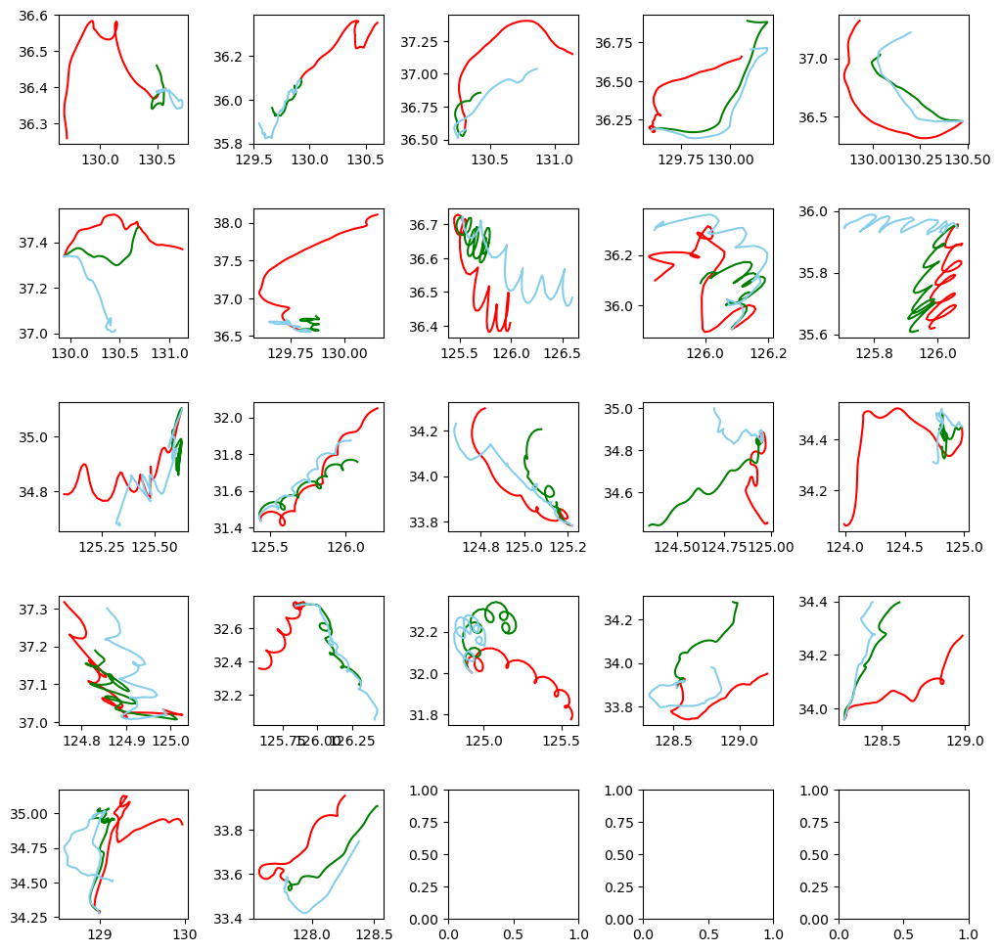

In [5]:
import sys
# MLP (activation relu) & roburst scaler & 특성 4 & 이전 연구 데이터 추가
f, axes = plt.subplots(5, 5)
# 격자 크기 설정
f.set_size_inches((12, 12))
# 격자 여백 설정
plt.subplots_adjust(wspace = 0.5, hspace = 0.5)
baseline_MAE_list = list() 
baseline_NCLS_list = list()
MAE_list = list()
NCLS_list = list()
test_case_list = list()

for i in range(len(dataset)):
    print( '--------------------- Model ', i,' ----------------------')
    # train dataset
    train_X = pd.DataFrame()
    train_y = np.array([[]])
    train = dataset[0:i] + dataset[i+1:len(dataset)]
    
    train_X = train[0][['wind_x', 'wind_y', 'water_velocity_y', 'water_velocity_x']]
    train_y = train[0][['diff_lon', 'diff_lat']]
    
    # 첫 행은 훈련에서 제외
    train_X = train_X[1:]
    train_y = train_y[1:].to_numpy()
    
    for j in range(1,len(train)):
        trina_xi = train[j][['wind_x', 'wind_y', 'water_velocity_y', 'water_velocity_x']] 
        trina_yi = train[j][['diff_lon', 'diff_lat']]
        trina_xi = trina_xi[1:]
        trina_yi = trina_yi[1:].to_numpy()
        
        train_X = pd.concat([train_X,trina_xi],ignore_index = True)
        train_y = np.concatenate((train_y,trina_yi), axis = 0)
    
    # 과거 데이터 훈련데이터에 추가
    for k in range(len(only_train_dataset)):
        trina_xi = only_train_dataset[k][['wind_x', 'wind_y', 'water_velocity_y', 'water_velocity_x']] 
        trina_yi = only_train_dataset[k][['diff_lon', 'diff_lat']]
        trina_xi = trina_xi[1:]
        trina_yi = trina_yi[1:].to_numpy()
      
        train_X = pd.concat([train_X,trina_xi],ignore_index = True)
        train_y = np.concatenate((train_y,trina_yi), axis = 0) 
    
    # Test dataset
    test = dataset[i]
    start_lon = dataset[i]['start_lon'][0]
    start_lat = dataset[i]['start_lat'][0]
    test_X = test[['wind_x', 'wind_y', 'water_velocity_y', 'water_velocity_x']]
    test_X = test_X[1:]
    test_y = test[['diff_lon', 'diff_lat']]
    test_y = test_y[1:].to_numpy()
    
    train_X, test_X = roburst_scaler(train_X, test_X)    
    
    MLP = tf.keras.Sequential([
    Dense(units = 30, input_dim = 4, activation = 'relu')
    ])
    MLP.add(Dense(units = 15, activation = 'relu'))
    MLP.add(Dense(units = 2))
    MLP.summary()
    MLP.compile(loss = 'mse', optimizer = 'adam', metrics = ['mae'])
    MLP.fit(train_X, train_y, epochs = 70, batch_size = 20)
    
    # model save
#     MLP.save(str(i)+'MLP_model.h5')

    # Predict
    y_pred = MLP.predict(test_X)
    
    # 행단위로 살펴보기
    test_case_df = dataset[i][['time', 'obs_x1_lon', 'obs_x1_lat', 'wind_y','wind_x','water_velocity_y','water_velocity_x','model_x2_lon', 'model_x2_lat']]
    test_case_df['rf_lon'] = start_lon
    test_case_df['rf_lat'] = start_lat
    test_case_df['ncls_model'] = 0
    test_case_df['ncls_rf'] = 0
    
    # case 별로 이상행 탐색
    for k in range(1,len(test_case_df)-1):
        test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
        test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
        test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
        test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
    
    test_case_df['rf_diff_lon'] = test_case_df['rf_lon'].diff()
    test_case_df['rf_diff_lon'][0] = 0
    test_case_df['rf_diff_lat'] = test_case_df['rf_lat'].diff()  
    test_case_df['rf_diff_lat'][0] = 0
    test_case_df['model_diff_lon'] = test_case_df['model_x2_lon'].diff() 
    test_case_df['model_diff_lon'][0] = 0
    test_case_df['model_diff_lat'] = test_case_df['model_x2_lat'].diff()
    test_case_df['model_diff_lat'][0] = 0
    
    test_case_list.append(test_case_df)
    # Plot
    lon, lat, baseline_lon, baseline_lat, lon_pred, lat_pred = drift_trajection_show(i,y_pred)
    row = i//5
    col = i%5
    axes[row][col].plot(lon, lat,'r-' ,baseline_lon, baseline_lat, 'g-', lon_pred, lat_pred, 'skyblue')   
    
    # evaluation 
    y = np.concatenate((lon.reshape((lon.shape[0],1)), lat.reshape((lat.shape[0],1))),axis = 1)
    pred = np.concatenate((lon_pred.reshape((lon_pred.shape[0],1)), lat_pred.reshape((lat_pred.shape[0],1))),axis =1)
    baseline_pred = np.concatenate((baseline_lon.reshape((baseline_lon.shape[0],1)), baseline_lat.reshape((baseline_lat.shape[0],1))),axis =1)
    
    #mae
    MAE_list.append(drift_mae(y, pred))
    baseline_MAE_list.append(drift_mae(y, baseline_pred))
    
    
    #NCLS
    NCLS_list.append(NCLS_score(y, pred))
    baseline_NCLS_list.append(NCLS_score(y, baseline_pred))

for i in range(len(MAE_list)):
    print('------------------------ Model ', i, '------------------------')
    print('baseline',str(i),' MAE : ',MAE_list[i])
    print('Model',str(i),' MAE : ', baseline_MAE_list[i])
    print('baseline',str(i),' NCLS : ',baseline_NCLS_list[i])
    print('Model',str(i),' NCLS : ', NCLS_list[i])

plt.show()

In [6]:
mae_sum = 0
baseline_mae_sum = 0
NCLS_sum = 0
baseline_NCLS_sum = 0

for i in range(len(dataset)):
    mae_sum += MAE_list[i]
    baseline_mae_sum += baseline_MAE_list[i]
    NCLS_sum += NCLS_list[i]
    baseline_NCLS_sum += baseline_NCLS_list[i]

# 라이브러리 Mae    
print ('Model Mae : ', mae_sum/len(dataset) )
print ('Baseline Mae : ', baseline_mae_sum/len(dataset) )
print ('Model NCLS : ', NCLS_sum/len(dataset) )
print ('Baseline NCLS : ', baseline_NCLS_sum/len(dataset) )

Model Mae :  0.20058840911777287
Baseline Mae :  0.18057603746811715
Model NCLS :  0.49217466520934
Baseline NCLS :  0.5326670971119444


C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:280: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['diff_lon'][0] = 0
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:283: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['diff_lat'][0] = 0
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: Futur

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:280: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['diff_lon'][0] = 0
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:283: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['diff_lat'][0] = 0
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: Futur

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:280: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFram

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = temp1.append(new_row,ignore_index=True).append(temp2, ignore_index=True)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\1412292214.py:275: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

--------------------- Model  0  ----------------------
Model: "sequential_28"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_84 (Dense)            (None, 30)                150       
                                                                 
 dense_85 (Dense)            (None, 15)                465       
                                                                 
 dense_86 (Dense)            (None, 2)                 32        
                                                                 
Total params: 647
Trainable params: 647
Non-trainable params: 0
_________________________________________________________________
Epoch 1/30
1178/1178 [==============================] - 2s 1ms/step - loss: 7.1173e-04 - mae: 0.0144
Epoch 2/30
1178/1178 [==============================] - 1s 1ms/step - loss: 5.1618e-05 - mae: 0.0054
Epoch 3/30
1178/1178 [==============================] - 1s 1ms

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:83: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'] = start_lon
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:84: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'] = start_lat
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:85: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead



C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in

--------------------- Model  1  ----------------------
Model: "sequential_29"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_87 (Dense)            (None, 30)                150       
                                                                 
 dense_88 (Dense)            (None, 15)                465       
                                                                 
 dense_89 (Dense)            (None, 2)                 32        
                                                                 
Total params: 647
Trainable params: 647
Non-trainable params: 0
_________________________________________________________________
Epoch 1/30
1157/1157 [==============================] - 2s 1ms/step - loss: 9.1060e-04 - mae: 0.0148
Epoch 2/30
1157/1157 [==============================] - 1s 1ms/step - loss: 4.1808e-05 - mae: 0.0044
Epoch 3/30
1157/1157 [==============================] - 1s 1ms

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:83: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'] = start_lon
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:84: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'] = start_lat
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:85: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead



C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCop

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCop

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in

--------------------- Model  2  ----------------------
Model: "sequential_30"


C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See

_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_90 (Dense)            (None, 30)                150       
                                                                 
 dense_91 (Dense)            (None, 15)                465       
                                                                 
 dense_92 (Dense)            (None, 2)                 32        
                                                                 
Total params: 647
Trainable params: 647
Non-trainable params: 0
_________________________________________________________________
Epoch 1/30
1143/1143 [==============================] - 2s 1ms/step - loss: 4.9197e-04 - mae: 0.0115
Epoch 2/30
1143/1143 [==============================] - 1s 1ms/step - loss: 2.9035e-05 - mae: 0.0040
Epoch 3/30
1143/1143 [==============================] - 2s 1ms/step - loss: 1.2281e-05 - mae: 0.0026
Epoch 4/30
1143/1143 [=================

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:83: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'] = start_lon
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:84: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'] = start_lat
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:85: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead



C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCop

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCop

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCop

--------------------- Model  3  ----------------------
Model: "sequential_31"


C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in

_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_93 (Dense)            (None, 30)                150       
                                                                 
 dense_94 (Dense)            (None, 15)                465       
                                                                 
 dense_95 (Dense)            (None, 2)                 32        
                                                                 
Total params: 647
Trainable params: 647
Non-trainable params: 0
_________________________________________________________________
Epoch 1/30
1129/1129 [==============================] - 2s 1ms/step - loss: 9.2283e-04 - mae: 0.0135
Epoch 2/30
1129/1129 [==============================] - 2s 1ms/step - loss: 2.4059e-05 - mae: 0.0036
Epoch 3/30
1129/1129 [==============================] - 2s 1ms/step - loss: 8.8314e-06 - mae: 0.0022
Epoch 4/30
1129/1129 [=================

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:83: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'] = start_lon
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:84: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'] = start_lat
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:85: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead



C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/index

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in

--------------------- Model  4  ----------------------
Model: "sequential_32"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_96 (Dense)            (None, 30)                150       
                                                                 
 dense_97 (Dense)            (None, 15)                465       
                                                                 
 dense_98 (Dense)            (None, 2)                 32        
                                                                 
Total params: 647
Trainable params: 647
Non-trainable params: 0
_________________________________________________________________
Epoch 1/30


C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in

1115/1115 [==============================] - 2s 1ms/step - loss: 0.0031 - mae: 0.0261
Epoch 2/30
1115/1115 [==============================] - 1s 1ms/step - loss: 1.1726e-04 - mae: 0.0082
Epoch 3/30
1115/1115 [==============================] - 1s 1ms/step - loss: 5.0246e-05 - mae: 0.0053
Epoch 4/30
1115/1115 [==============================] - 1s 1ms/step - loss: 2.6235e-05 - mae: 0.0038
Epoch 5/30
1115/1115 [==============================] - 1s 1ms/step - loss: 1.6033e-05 - mae: 0.0029
Epoch 6/30
1115/1115 [==============================] - 1s 1ms/step - loss: 9.6810e-06 - mae: 0.0023
Epoch 7/30
1115/1115 [==============================] - 1s 1ms/step - loss: 6.2264e-06 - mae: 0.0018
Epoch 8/30
1115/1115 [==============================] - 2s 1ms/step - loss: 5.2500e-06 - mae: 0.0016
Epoch 9/30
1115/1115 [==============================] - 1s 1ms/step - loss: 3.4567e-06 - mae: 0.0014
Epoch 10/30
1115/1115 [==============================] - 1s 1ms/step - loss: 3.8573e-06 - mae: 0.0013
Epoc

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:83: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'] = start_lon
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:84: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'] = start_lat
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:85: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead



C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCop

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCop

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/index

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCop

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCop

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCop

--------------------- Model  5  ----------------------
Model: "sequential_33"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_99 (Dense)            (None, 30)                150       
                                                                 
 dense_100 (Dense)           (None, 15)                465       
                                                                 
 dense_101 (Dense)           (None, 2)                 32        
                                                                 
Total params: 647
Trainable params: 647
Non-trainable params: 0
_________________________________________________________________
Epoch 1/30
1101/1101 [==============================] - 2s 1ms/step - loss: 0.0031 - mae: 0.0258
Epoch 2/30
1101/1101 [==============================] - 1s 1ms/step - loss: 1.0769e-04 - mae: 0.0079
Epoch 3/30
1101/1101 [==============================] - 2s 1ms/ste

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:83: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'] = start_lon
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:84: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'] = start_lat
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:85: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead



C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCop

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCop

--------------------- Model  6  ----------------------
Model: "sequential_34"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_102 (Dense)           (None, 30)                150       
                                                                 
 dense_103 (Dense)           (None, 15)                465       
                                                                 
 dense_104 (Dense)           (None, 2)                 32        
                                                                 
Total params: 647
Trainable params: 647
Non-trainable params: 0
_________________________________________________________________
Epoch 1/30
1087/1087 [==============================] - 2s 1ms/step - loss: 5.3050e-04 - mae: 0.0128
Epoch 2/30
1087/1087 [==============================] - 1s 1ms/step - loss: 3.7549e-05 - mae: 0.0045
Epoch 3/30
1087/1087 [==============================] - 1s 1ms

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:83: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'] = start_lon
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:84: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'] = start_lat
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:85: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead



C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCop

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCop

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCop

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCop

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCop

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCop

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCop

--------------------- Model  7  ----------------------
Model: "sequential_35"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_105 (Dense)           (None, 30)                150       
                                                                 
 dense_106 (Dense)           (None, 15)                465       
                                                                 
 dense_107 (Dense)           (None, 2)                 32        
                                                                 
Total params: 647
Trainable params: 647
Non-trainable params: 0
_________________________________________________________________
Epoch 1/30
1072/1072 [==============================] - 2s 1ms/step - loss: 0.0024 - mae: 0.0210
Epoch 2/30
1072/1072 [==============================] - 2s 1ms/step - loss: 1.6203e-05 - mae: 0.0025
Epoch 3/30
1072/1072 [==============================] - 2s 2ms/ste

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:83: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'] = start_lon
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:84: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'] = start_lat
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:85: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead



C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCop

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/index

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in

--------------------- Model  8  ----------------------
Model: "sequential_36"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_108 (Dense)           (None, 30)                150       
                                                                 
 dense_109 (Dense)           (None, 15)                465       
                                                                 
 dense_110 (Dense)           (None, 2)                 32        
                                                                 
Total params: 647
Trainable params: 647
Non-trainable params: 0
_________________________________________________________________


C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCop

Epoch 1/30
1058/1058 [==============================] - 2s 1ms/step - loss: 9.8876e-04 - mae: 0.0161
Epoch 2/30
1058/1058 [==============================] - 1s 1ms/step - loss: 5.2018e-05 - mae: 0.0054
Epoch 3/30
1058/1058 [==============================] - 1s 1ms/step - loss: 2.5185e-05 - mae: 0.0038
Epoch 4/30
1058/1058 [==============================] - 1s 1ms/step - loss: 1.4000e-05 - mae: 0.0029
Epoch 5/30
1058/1058 [==============================] - 1s 1ms/step - loss: 8.5569e-06 - mae: 0.0022
Epoch 6/30
1058/1058 [==============================] - 1s 1ms/step - loss: 5.9900e-06 - mae: 0.0019
Epoch 7/30
1058/1058 [==============================] - 1s 1ms/step - loss: 4.0145e-06 - mae: 0.0015
Epoch 8/30
1058/1058 [==============================] - 1s 1ms/step - loss: 3.1977e-06 - mae: 0.0014
Epoch 9/30
1058/1058 [==============================] - 1s 1ms/step - loss: 2.7605e-06 - mae: 0.0013
Epoch 10/30
1058/1058 [==============================] - 1s 1ms/step - loss: 2.2879e-06 - m

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:83: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'] = start_lon
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:84: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'] = start_lat
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:85: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead



C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCop

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCop

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCop

--------------------- Model  9  ----------------------
Model: "sequential_37"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_111 (Dense)           (None, 30)                150       
                                                                 
 dense_112 (Dense)           (None, 15)                465       
                                                                 
 dense_113 (Dense)           (None, 2)                 32        
                                                                 
Total params: 647
Trainable params: 647
Non-trainable params: 0
_________________________________________________________________


C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See

Epoch 1/30
1044/1044 [==============================] - 2s 1ms/step - loss: 5.2648e-04 - mae: 0.0134
Epoch 2/30
1044/1044 [==============================] - 1s 1ms/step - loss: 3.9527e-05 - mae: 0.0047
Epoch 3/30
1044/1044 [==============================] - 1s 1ms/step - loss: 1.8678e-05 - mae: 0.0033
Epoch 4/30
1044/1044 [==============================] - 1s 1ms/step - loss: 1.1278e-05 - mae: 0.0026
Epoch 5/30
1044/1044 [==============================] - 1s 1ms/step - loss: 7.2298e-06 - mae: 0.0020
Epoch 6/30
1044/1044 [==============================] - 1s 1ms/step - loss: 4.7435e-06 - mae: 0.0017
Epoch 7/30
1044/1044 [==============================] - 1s 1ms/step - loss: 3.6613e-06 - mae: 0.0015
Epoch 8/30
1044/1044 [==============================] - 1s 1ms/step - loss: 2.8905e-06 - mae: 0.0013
Epoch 9/30
1044/1044 [==============================] - 1s 1ms/step - loss: 2.4381e-06 - mae: 0.0012
Epoch 10/30
1044/1044 [==============================] - 1s 1ms/step - loss: 2.1443e-06 - m

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:83: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'] = start_lon
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:84: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'] = start_lat
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:85: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead



C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCop

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCop

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCop

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/index

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCop

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in

--------------------- Model  10  ----------------------
Model: "sequential_38"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_114 (Dense)           (None, 30)                150       
                                                                 
 dense_115 (Dense)           (None, 15)                465       
                                                                 
 dense_116 (Dense)           (None, 2)                 32        
                                                                 
Total params: 647
Trainable params: 647
Non-trainable params: 0
_________________________________________________________________
Epoch 1/30
1030/1030 [==============================] - 2s 1ms/step - loss: 0.0015 - mae: 0.0190
Epoch 2/30
1030/1030 [==============================] - 1s 1ms/step - loss: 8.0309e-05 - mae: 0.0067
Epoch 3/30
1030/1030 [==============================] - 1s 1ms/st

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:83: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'] = start_lon
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:84: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'] = start_lat
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:85: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead



C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCop

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/index

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCop

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCop

--------------------- Model  11  ----------------------
Model: "sequential_39"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_117 (Dense)           (None, 30)                150       
                                                                 
 dense_118 (Dense)           (None, 15)                465       
                                                                 
 dense_119 (Dense)           (None, 2)                 32        
                                                                 
Total params: 647
Trainable params: 647
Non-trainable params: 0
_________________________________________________________________
Epoch 1/30
1016/1016 [==============================] - 2s 1ms/step - loss: 0.0011 - mae: 0.0176
Epoch 2/30
1016/1016 [==============================] - 1s 1ms/step - loss: 5.7764e-05 - mae: 0.0056
Epoch 3/30
1016/1016 [==============================] - 2s 2ms/st

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:83: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'] = start_lon
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:84: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'] = start_lat
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:85: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead



C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCop

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCop

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCop

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCop

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See

--------------------- Model  12  ----------------------
Model: "sequential_40"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_120 (Dense)           (None, 30)                150       
                                                                 
 dense_121 (Dense)           (None, 15)                465       
                                                                 
 dense_122 (Dense)           (None, 2)                 32        
                                                                 
Total params: 647
Trainable params: 647
Non-trainable params: 0
_________________________________________________________________
Epoch 1/30


C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in

1002/1002 [==============================] - 2s 1ms/step - loss: 0.0067 - mae: 0.0390
Epoch 2/30
1002/1002 [==============================] - 1s 1ms/step - loss: 2.2430e-04 - mae: 0.0111
Epoch 3/30
1002/1002 [==============================] - 1s 1ms/step - loss: 1.0623e-04 - mae: 0.0077
Epoch 4/30
1002/1002 [==============================] - 1s 1ms/step - loss: 6.2202e-05 - mae: 0.0059
Epoch 5/30
1002/1002 [==============================] - 1s 1ms/step - loss: 3.7261e-05 - mae: 0.0046
Epoch 6/30
1002/1002 [==============================] - 1s 1ms/step - loss: 2.5436e-05 - mae: 0.0038
Epoch 7/30
1002/1002 [==============================] - 1s 1ms/step - loss: 1.7406e-05 - mae: 0.0031
Epoch 8/30
1002/1002 [==============================] - 1s 1ms/step - loss: 1.1827e-05 - mae: 0.0026
Epoch 9/30
1002/1002 [==============================] - 1s 1ms/step - loss: 7.7294e-06 - mae: 0.0021
Epoch 10/30
1002/1002 [==============================] - 1s 1ms/step - loss: 5.8760e-06 - mae: 0.0018
Epoc

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:83: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'] = start_lon
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:84: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'] = start_lat
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:85: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead



C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCop

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCop

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in

--------------------- Model  13  ----------------------
Model: "sequential_41"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_123 (Dense)           (None, 30)                150       
                                                                 
 dense_124 (Dense)           (None, 15)                465       
                                                                 
 dense_125 (Dense)           (None, 2)                 32        
                                                                 
Total params: 647
Trainable params: 647
Non-trainable params: 0
_________________________________________________________________
Epoch 1/30
988/988 [==============================] - 2s 1ms/step - loss: 0.0010 - mae: 0.0172
Epoch 2/30
988/988 [==============================] - 1s 1ms/step - loss: 6.2728e-05 - mae: 0.0060
Epoch 3/30
988/988 [==============================] - 1s 1ms/step - l

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:83: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'] = start_lon
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:84: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'] = start_lat
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:85: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead



C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCop

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCop

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCop

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCop

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCop

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See

--------------------- Model  14  ----------------------
Model: "sequential_42"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_126 (Dense)           (None, 30)                150       
                                                                 
 dense_127 (Dense)           (None, 15)                465       
                                                                 
 dense_128 (Dense)           (None, 2)                 32        
                                                                 
Total params: 647
Trainable params: 647
Non-trainable params: 0
_________________________________________________________________


C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in

Epoch 1/30
973/973 [==============================] - 2s 1ms/step - loss: 6.9752e-04 - mae: 0.0122
Epoch 2/30
973/973 [==============================] - 1s 1ms/step - loss: 1.7445e-05 - mae: 0.0027
Epoch 3/30
973/973 [==============================] - 2s 2ms/step - loss: 7.4049e-06 - mae: 0.0019
Epoch 4/30
973/973 [==============================] - 1s 1ms/step - loss: 4.5190e-06 - mae: 0.0016
Epoch 5/30
973/973 [==============================] - 1s 1ms/step - loss: 3.3605e-06 - mae: 0.0014
Epoch 6/30
973/973 [==============================] - 1s 1ms/step - loss: 2.6796e-06 - mae: 0.0013
Epoch 7/30
973/973 [==============================] - 1s 1ms/step - loss: 2.3788e-06 - mae: 0.0012
Epoch 8/30
973/973 [==============================] - 1s 1ms/step - loss: 2.1234e-06 - mae: 0.0011
Epoch 9/30
973/973 [==============================] - 1s 1ms/step - loss: 1.9933e-06 - mae: 0.0011
Epoch 10/30
973/973 [==============================] - 1s 1ms/step - loss: 1.7209e-06 - mae: 0.0010
Epoch 11/

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:83: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'] = start_lon
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:84: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'] = start_lat
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:85: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead



C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCop

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCop

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCop

--------------------- Model  15  ----------------------
Model: "sequential_43"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_129 (Dense)           (None, 30)                150       
                                                                 
 dense_130 (Dense)           (None, 15)                465       
                                                                 
 dense_131 (Dense)           (None, 2)                 32        
                                                                 
Total params: 647
Trainable params: 647
Non-trainable params: 0
_________________________________________________________________


C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCop

Epoch 1/30
959/959 [==============================] - 2s 1ms/step - loss: 0.0010 - mae: 0.0181
Epoch 2/30
959/959 [==============================] - 1s 1ms/step - loss: 7.5378e-05 - mae: 0.0065
Epoch 3/30
959/959 [==============================] - 1s 1ms/step - loss: 3.4059e-05 - mae: 0.0044
Epoch 4/30
959/959 [==============================] - 1s 1ms/step - loss: 1.8360e-05 - mae: 0.0032
Epoch 5/30
959/959 [==============================] - 1s 1ms/step - loss: 1.1505e-05 - mae: 0.0025
Epoch 6/30
959/959 [==============================] - 1s 1ms/step - loss: 7.7484e-06 - mae: 0.0020
Epoch 7/30
959/959 [==============================] - 1s 1ms/step - loss: 5.8959e-06 - mae: 0.0018
Epoch 8/30
959/959 [==============================] - 1s 1ms/step - loss: 4.2749e-06 - mae: 0.0015
Epoch 9/30
959/959 [==============================] - 1s 1ms/step - loss: 3.5340e-06 - mae: 0.0014
Epoch 10/30
959/959 [==============================] - 1s 1ms/step - loss: 2.7723e-06 - mae: 0.0012
Epoch 11/30
9

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:83: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'] = start_lon
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:84: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'] = start_lat
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:85: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead



C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCop

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCop

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See

--------------------- Model  16  ----------------------
Model: "sequential_44"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_132 (Dense)           (None, 30)                150       
                                                                 
 dense_133 (Dense)           (None, 15)                465       
                                                                 
 dense_134 (Dense)           (None, 2)                 32        
                                                                 
Total params: 647
Trainable params: 647
Non-trainable params: 0
_________________________________________________________________
Epoch 1/30
945/945 [==============================] - 2s 1ms/step - loss: 0.0014 - mae: 0.0200
Epoch 2/30
945/945 [==============================] - 1s 1ms/step - loss: 8.0761e-05 - mae: 0.0067
Epoch 3/30
945/945 [==============================] - 1s 2ms/step - l

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:83: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'] = start_lon
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:84: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'] = start_lat
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:85: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead



C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCop

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See

--------------------- Model  17  ----------------------
Model: "sequential_45"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_135 (Dense)           (None, 30)                150       
                                                                 
 dense_136 (Dense)           (None, 15)                465       
                                                                 
 dense_137 (Dense)           (None, 2)                 32        
                                                                 
Total params: 647
Trainable params: 647
Non-trainable params: 0
_________________________________________________________________
Epoch 1/30


C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See

931/931 [==============================] - 2s 1ms/step - loss: 7.0697e-04 - mae: 0.0135
Epoch 2/30
931/931 [==============================] - 1s 1ms/step - loss: 4.1681e-05 - mae: 0.0047
Epoch 3/30
931/931 [==============================] - 1s 1ms/step - loss: 1.9930e-05 - mae: 0.0032
Epoch 4/30
931/931 [==============================] - 1s 1ms/step - loss: 1.1614e-05 - mae: 0.0024
Epoch 5/30
931/931 [==============================] - 1s 1ms/step - loss: 7.9799e-06 - mae: 0.0020
Epoch 6/30
931/931 [==============================] - 1s 1ms/step - loss: 5.5707e-06 - mae: 0.0017
Epoch 7/30
931/931 [==============================] - 1s 1ms/step - loss: 4.7827e-06 - mae: 0.0016
Epoch 8/30
931/931 [==============================] - 1s 1ms/step - loss: 3.4850e-06 - mae: 0.0014
Epoch 9/30
931/931 [==============================] - 1s 1ms/step - loss: 2.9344e-06 - mae: 0.0013
Epoch 10/30
931/931 [==============================] - 1s 1ms/step - loss: 2.8164e-06 - mae: 0.0013
Epoch 11/30
931/931 

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:83: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'] = start_lon
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:84: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'] = start_lat
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:85: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead



C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCop

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCop

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See

--------------------- Model  18  ----------------------
Model: "sequential_46"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_138 (Dense)           (None, 30)                150       
                                                                 
 dense_139 (Dense)           (None, 15)                465       
                                                                 
 dense_140 (Dense)           (None, 2)                 32        
                                                                 
Total params: 647
Trainable params: 647
Non-trainable params: 0
_________________________________________________________________


C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in

Epoch 1/30
917/917 [==============================] - 2s 1ms/step - loss: 8.1642e-04 - mae: 0.0155
Epoch 2/30
917/917 [==============================] - 1s 1ms/step - loss: 6.7754e-05 - mae: 0.0060
Epoch 3/30
917/917 [==============================] - 1s 1ms/step - loss: 3.3186e-05 - mae: 0.0043
Epoch 4/30
917/917 [==============================] - 1s 1ms/step - loss: 2.0404e-05 - mae: 0.0033
Epoch 5/30
917/917 [==============================] - 1s 2ms/step - loss: 1.2940e-05 - mae: 0.0027
Epoch 6/30
917/917 [==============================] - 1s 1ms/step - loss: 9.1169e-06 - mae: 0.0022
Epoch 7/30
917/917 [==============================] - 1s 2ms/step - loss: 6.7208e-06 - mae: 0.0019
Epoch 8/30
917/917 [==============================] - 1s 1ms/step - loss: 4.9033e-06 - mae: 0.0016
Epoch 9/30
917/917 [==============================] - 1s 1ms/step - loss: 4.2739e-06 - mae: 0.0015
Epoch 10/30
917/917 [==============================] - 1s 2ms/step - loss: 2.9655e-06 - mae: 0.0013
Epoch 11/

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:83: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'] = start_lon
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:84: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'] = start_lat
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:85: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead



C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCop

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCop

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in

--------------------- Model  19  ----------------------
Model: "sequential_47"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_141 (Dense)           (None, 30)                150       
                                                                 
 dense_142 (Dense)           (None, 15)                465       
                                                                 
 dense_143 (Dense)           (None, 2)                 32        
                                                                 
Total params: 647
Trainable params: 647
Non-trainable params: 0
_________________________________________________________________
Epoch 1/30


C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:95: SettingWithCop

903/903 [==============================] - 2s 1ms/step - loss: 0.0014 - mae: 0.0189
Epoch 2/30
903/903 [==============================] - 1s 1ms/step - loss: 6.4817e-05 - mae: 0.0057
Epoch 3/30
903/903 [==============================] - 2s 2ms/step - loss: 3.1516e-05 - mae: 0.0039
Epoch 4/30
903/903 [==============================] - 1s 1ms/step - loss: 1.8253e-05 - mae: 0.0029
Epoch 5/30
903/903 [==============================] - 1s 1ms/step - loss: 1.2242e-05 - mae: 0.0024
Epoch 6/30
903/903 [==============================] - 1s 1ms/step - loss: 7.9346e-06 - mae: 0.0020
Epoch 7/30
903/903 [==============================] - 1s 1ms/step - loss: 5.9730e-06 - mae: 0.0017
Epoch 8/30
903/903 [==============================] - 1s 1ms/step - loss: 4.4792e-06 - mae: 0.0015
Epoch 9/30
903/903 [==============================] - 1s 1ms/step - loss: 4.1024e-06 - mae: 0.0015
Epoch 10/30
903/903 [==============================] - 1s 2ms/step - loss: 3.5836e-06 - mae: 0.0014
Epoch 11/30
903/903 [===

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:83: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'] = start_lon
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:84: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'] = start_lat
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:85: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead



C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCop

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCop

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCop

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCop

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCop

--------------------- Model  20  ----------------------
Model: "sequential_48"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_144 (Dense)           (None, 30)                150       
                                                                 
 dense_145 (Dense)           (None, 15)                465       
                                                                 
 dense_146 (Dense)           (None, 2)                 32        
                                                                 
Total params: 647
Trainable params: 647
Non-trainable params: 0
_________________________________________________________________
Epoch 1/30
860/860 [==============================] - 2s 1ms/step - loss: 0.0028 - mae: 0.0260
Epoch 2/30
860/860 [==============================] - 1s 1ms/step - loss: 1.1705e-04 - mae: 0.0081
Epoch 3/30
860/860 [==============================] - 1s 1ms/step - l

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:83: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'] = start_lon
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:84: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'] = start_lat
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:85: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead



C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCop

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCop

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCop

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCop

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCop

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCop

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCop

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCop

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCop

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCop

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCop

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCop

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in

--------------------- Model  21  ----------------------
Model: "sequential_49"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_147 (Dense)           (None, 30)                150       
                                                                 
 dense_148 (Dense)           (None, 15)                465       
                                                                 
 dense_149 (Dense)           (None, 2)                 32        
                                                                 
Total params: 647
Trainable params: 647
Non-trainable params: 0
_________________________________________________________________
Epoch 1/30
860/860 [==============================] - 1s 1ms/step - loss: 0.0032 - mae: 0.0249
Epoch 2/30
860/860 [==============================] - 1s 1ms/step - loss: 9.0335e-05 - mae: 0.0069
Epoch 3/30
860/860 [==============================] - 1s 1ms/step - l

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:83: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'] = start_lon
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:84: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'] = start_lat
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:85: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead



C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCop

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCop

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_3820\3607627919.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See

------------------------ Model  0 ------------------------


IndexError: list index out of range

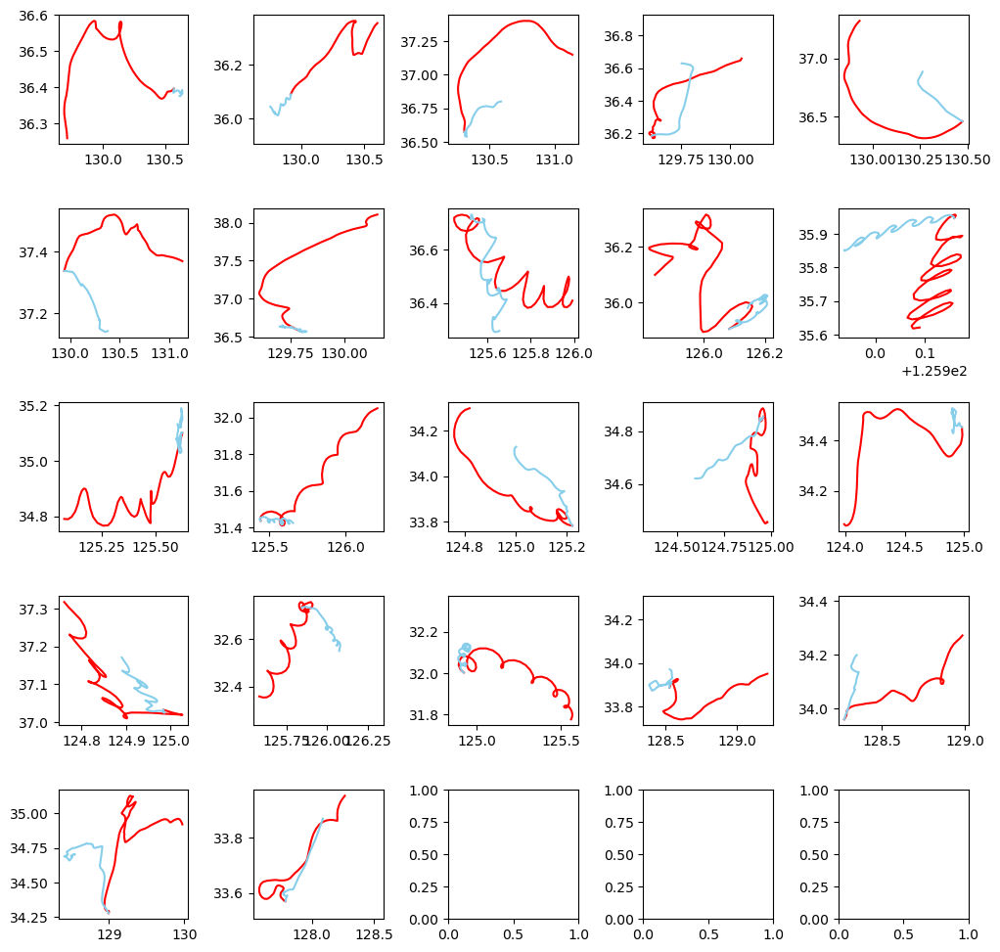

In [10]:
import sys
# MLP (activation relu) & roburst scaler & 특성 4 & 이전 연구 데이터 추가
f, axes = plt.subplots(5, 5)
# 격자 크기 설정
f.set_size_inches((12, 12))
# 격자 여백 설정
plt.subplots_adjust(wspace = 0.5, hspace = 0.5)
baseline_MAE_list = list() 
baseline_NCLS_list = list()
MAE_list = list()
NCLS_list = list()
test_case_list = list()

data_augmenatation(dataset)
data_augmenatation(only_train_dataset)

for i in range(len(dataset)):
    print( '--------------------- Model ', i,' ----------------------')
    # train dataset
    train_X = pd.DataFrame()
    train_y = np.array([[]])
    train = dataset[0:i] + dataset[i+1:len(dataset)]
    
    train_X = train[0][['wind_x', 'wind_y', 'water_velocity_y', 'water_velocity_x']]
    train_y = train[0][['diff_lon', 'diff_lat']]
    
    # 첫 행은 훈련에서 제외
    train_X = train_X[1:]
    train_y = train_y[1:].to_numpy()
    
    for j in range(1,len(train)):
        trina_xi = train[j][['wind_x', 'wind_y', 'water_velocity_y', 'water_velocity_x']] 
        trina_yi = train[j][['diff_lon', 'diff_lat']]
        trina_xi = trina_xi[1:]
        trina_yi = trina_yi[1:].to_numpy()
        
        train_X = pd.concat([train_X,trina_xi],ignore_index = True)
        train_y = np.concatenate((train_y,trina_yi), axis = 0)
    
    # 과거 데이터 훈련데이터에 추가
    for k in range(len(only_train_dataset)):
        trina_xi = only_train_dataset[k][['wind_x', 'wind_y', 'water_velocity_y', 'water_velocity_x']] 
        trina_yi = only_train_dataset[k][['diff_lon', 'diff_lat']]
        trina_xi = trina_xi[1:]
        trina_yi = trina_yi[1:].to_numpy()
      
        train_X = pd.concat([train_X,trina_xi],ignore_index = True)
        train_y = np.concatenate((train_y,trina_yi), axis = 0) 
    
    # Test dataset
    test = dataset[i]
    start_lon = dataset[i]['start_lon'][0]
    start_lat = dataset[i]['start_lat'][0]
    test_X = test[['wind_x', 'wind_y', 'water_velocity_y', 'water_velocity_x']]
    test_X = test_X[1:]
    test_y = test[['diff_lon', 'diff_lat']]
    test_y = test_y[1:].to_numpy()
    
    train_X, test_X = roburst_scaler(train_X, test_X)    
    
    MLP = tf.keras.Sequential([
    Dense(units = 30, input_dim = 4, activation = 'relu')
    ])
    MLP.add(Dense(units = 15, activation = 'relu'))
    MLP.add(Dense(units = 2))
    MLP.summary()
    MLP.compile(loss = 'mse', optimizer = 'adam', metrics = ['mae'])
    MLP.fit(train_X, train_y, epochs = 30, batch_size = 20)
    
    # model save
    # MLP.save(str(i)+'MLP_model.h5')

    # Predict
    y_pred = MLP.predict(test_X)
    dataset[i] = dataset[i][::2]
    dataset[i] = dataset[i].reset_index(drop=True)
    y_pred = y_pred[::2]
    test_X = test_X[::2]
    test_y = test_y[::2]
    
    # 행단위로 살펴보기
    test_case_df = dataset[i][['time', 'obs_x1_lon', 'obs_x1_lat', 'wind_y','wind_x','water_velocity_y','water_velocity_x','model_x2_lon', 'model_x2_lat']]
    test_case_df['rf_lon'] = start_lon
    test_case_df['rf_lat'] = start_lat
    test_case_df['ncls_model'] = 0
    test_case_df['ncls_rf'] = 0
    
    # case 별로 이상행 탐색
    for k in range(1,len(test_case_df)-1):
        test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
        test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
        test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
        test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
    
    test_case_df['rf_diff_lon'] = test_case_df['rf_lon'].diff()
    test_case_df['rf_diff_lon'][0] = 0
    test_case_df['rf_diff_lat'] = test_case_df['rf_lat'].diff()  
    test_case_df['rf_diff_lat'][0] = 0
    test_case_df['model_diff_lon'] = test_case_df['model_x2_lon'].diff() 
    test_case_df['model_diff_lon'][0] = 0
    test_case_df['model_diff_lat'] = test_case_df['model_x2_lat'].diff()
    test_case_df['model_diff_lat'][0] = 0
    
    test_case_list.append(test_case_df)
    # Plot
    lon, lat, baseline_lon, baseline_lat, lon_pred, lat_pred = drift_trajection_show(i,y_pred)
    row = i//5
    col = i%5
    axes[row][col].plot(lon, lat,'r-' ,baseline_lon, baseline_lat, 'g-', lon_pred, lat_pred, 'skyblue')   
    
    # evaluation 
    y = np.concatenate((lon.reshape((lon.shape[0],1)), lat.reshape((lat.shape[0],1))),axis = 1)
    pred = np.concatenate((lon_pred.reshape((lon_pred.shape[0],1)), lat_pred.reshape((lat_pred.shape[0],1))),axis =1)
#     baseline_pred = np.concatenate((baseline_lon.reshape((baseline_lon.shape[0],1)), baseline_lat.reshape((baseline_lat.shape[0],1))),axis =1)
    
    #mae
    MAE_list.append(drift_mae(y, pred))
#     baseline_MAE_list.append(drift_mae(y, baseline_pred))
    
    
    #NCLS
    NCLS_list.append(NCLS_score(y, pred))
#     baseline_NCLS_list.append(NCLS_score(y, baseline_pred))

for i in range(len(MAE_list)):
    print('------------------------ Model ', i, '------------------------')
#     print('baseline',str(i),' MAE : ',MAE_list[i])
    print('Model',str(i),' MAE : ', baseline_MAE_list[i])
#     print('baseline',str(i),' NCLS : ',baseline_NCLS_list[i])
    print('Model',str(i),' NCLS : ', NCLS_list[i])

plt.show()

In [11]:
mae_sum = 0
NCLS_sum = 0

for i in range(len(dataset)):
    mae_sum += MAE_list[i]
    NCLS_sum += NCLS_list[i]

# 라이브러리 Mae    
print ('Model Mae : ', mae_sum/len(dataset) )
print ('Model NCLS : ', NCLS_sum/len(dataset) )

Model Mae :  0.20854599306971247
Model NCLS :  0.48349080486348756
